## Verge and foliot mechanism

- https://github.com/JuliaReach/ReachabilityModels.jl/issues/52

- https://github.com/SciML/DifferentialEquations.jl/issues/703

In [1]:
using ReachabilityAnalysis, LinearAlgebra, Plots, IntervalConstraintProgramming
const IA = IntervalArithmetic
LazySets.set_ztol(Float64, 1e-12)

1.0e-12

In [32]:
plotly()

Plots.PlotlyBackend()

In [2]:
const torque = 1.0
const Ic = 10.0
const Iv = 0.15
const r_c = 1.0
const r_v = 0.3
const αc = 24.0 * pi/180
const e_r = 0.05
const nteeth = round(Int, 2pi/αc) # n
const Mv = Iv/r_v^2
const Mc = Ic/r_c^2
const Gc = Mv*(1 + e_r)/r_c/(Mv + Mc)
const Gv = Mc*(1 + e_r)/r_v/(Mv + Mc)
const αv = Gv*r_c/(1-e_r)*αc/2

p = (torque, Ic);

```julia
function f(du,u,p,t)
  du[1] = u[3]
  du[2] = u[4]
  du[3] = p[1]/p[2] # p =(torque, crown inertia)
  du[4] = 0.0
end

# out = vector of length 2nteeth
function condition(out,u,t,integrator)     
    for m in 1:nteeth
        out[m] = r_c*sin(u[1] - (m-1)*αc) - r_v*tan(u[2] + αv/2) #upper
        out[m + nteeth] = r_c*sin((m-1)*αc - u[1]) - r_v*tan(-u[2] + αv/2) #lower
    end
end

function affect!(integrator, m)
    c_up = r_c*integrator.u[3] - r_v*integrator.u[4] > 0.0 && ( (m-1)*αc <= mod(integrator.u[1] + αc/2, 2π) <= m*αc)#upper
    c_dn = r_c*integrator.u[3] + r_v*integrator.u[4] > 0.0 && ( (m-1)*αc <= mod(integrator.u[1] + αc/2 + π, 2π) <= m*αc ) #lower
    if m <= nteeth && c_up
        integrator.u[3] += -r_c*Gc*integrator.u[3] + r_v*Gc*integrator.u[4]
        integrator.u[4] += + r_c*Gv*integrator.u[3] - r_v*Gv*integrator.u[4] 
    elseif m > nteeth && c_dn
        integrator.u[3] +=  -r_c*Gc*integrator.u[3] - r_v*Gc*integrator.u[4]
        integrator.u[4] +=  -r_c*Gv*integrator.u[3] - r_v*Gv*integrator.u[4] 
    end
end

cb = VectorContinuousCallback(condition,affect!,2nteeth)

u0 = [0, 0.0, 0.0, 3.0]
prob = ODEProblem(f,u0,(0.0,2.0),p)
sol = solve(prob, callback=cb) #, adaptive=false
plot(sol,layout=(4,1))
```

In [3]:
# overapproximate a nonlinear constraint with an HPolyhedron
dom = IntervalBox(IA.Interval(-2, 2), IA.Interval(-2, 2))
C = @constraint x^2 + y^2 <= 1
pav = pave(C, dom, 0.1)
dirs = OctDirections(2)
H = overapproximate(pav, dirs)
B2 = Ball2([0, 0.], 1.0)
B2 ⊆ H

true

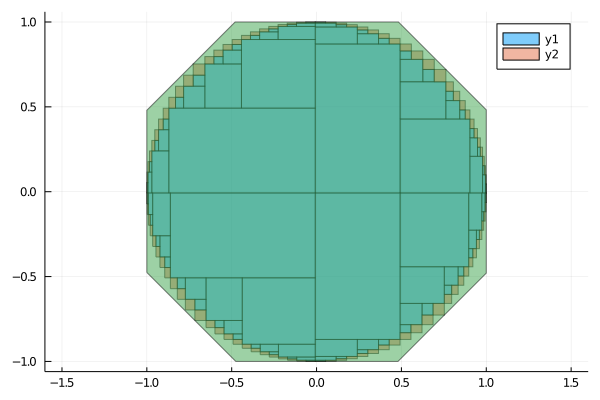

In [4]:
plot(pav.inner, ratio=1)
plot!(pav.boundary, ratio=1)
plot!(H)

In [5]:
# overapproximate a nonlinear constraint with an HPolyhedron
dom = IntervalBox(IA.Interval(-10, 10), IA.Interval(-10, 10))
m = 1
C = @constraint $r_c*sin(x - ($m-1)* ($αc)) - $r_v*tan(y + $αv/2) == 0

Separator:
  - variables: x, y
  - expression: 1.0 * sin(x - (1 - 1) * 0.41887902047863906) - 0.3 * tan(y + 0.6613879270715354 / 2) ∈ [0, 0]

In [6]:
pav = pave(C, dom, 0.1)

Paving:
- tolerance ϵ = 0.1
- inner approx. of length 0
- boundary approx. of length 2374

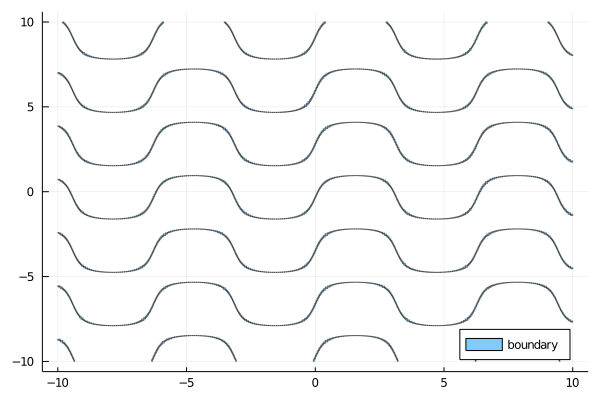

In [7]:
plot(pav.boundary, lab="boundary", legend=:bottomright)

In [8]:
typeof(pav.boundary)

Array{IntervalBox{2,Float64},1}

In [33]:
Y = ConvexHullArray([convert(Hyperrectangle, X) for X in pav.boundary]);

plot(pav.boundary, lab="boundary", legend=:bottomright)
plot!(Y, lab="convex hull")

<!DOCTYPE html>
 
 
 Plots.jl

In [34]:
dirs = OctDirections(2)
H = overapproximate(pav, dirs);

plot(pav.boundary, ratio=1)
plot!(H, alpha=.4, lab="oct directions")

<!DOCTYPE html>
 
 
 Plots.jl

## Continuous post-operator

In [35]:
A = zeros(5, 5) # variables x1, x2, x3, x4 and the last variable wraps the constant input term
A[1, 3] = 1.0
A[2, 4] = 1.0
A[3, 5] = 1.0

X0 = Singleton([0, 0, 0, 3.0, p[1]/p[2]])
prob = @ivp(x' = A*x, x(0) ∈ X0)

InitialValueProblem{LinearContinuousSystem{Float64,Array{Float64,2}},Singleton{Float64,Array{Float64,1}}}(LinearContinuousSystem{Float64,Array{Float64,2}}([0.0 0.0 … 0.0 0.0; 0.0 0.0 … 1.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]), Singleton{Float64,Array{Float64,1}}([0.0, 0.0, 0.0, 3.0, 0.1]))

In [36]:
sol = solve(prob, tspan=(0.0, 0.2))

plot(sol, vars=(0, 1), xlab="t", ylab="x₁(t)")

<!DOCTYPE html>
 
 
 Plots.jl

In [80]:
upper_trig(m) = @constraint $r_c*sin(x1 - ($m-1)* ($αc)) - $r_v*tan(x2 + $αv/2) == 0

lower_trig(m) = @constraint $r_c*sin(($m-1)* ($αc) - x1) - $r_v*tan(-x2 + $αv/2) == 0;

We observe that it takes a very long time to converge if we include the terms $0x_3 + 0x_4 + 0x_5$. In turn we can take the Cartesian product with the universal sets a posteriori.

In [104]:
#dom = IntervalBox(-0.2 .. 0.2, 2)
dom = (-0.2 .. 0.2) × (-2 .. 2)

[-0.200001, 0.200001] × [-2, 2]

In [105]:
U = [pave(upper_trig(i), dom, 0.05) for i in 1:15];
L = [pave(lower_trig(i), dom, 0.05) for i in 1:15];

In [106]:
U[1]

Paving:
- tolerance ϵ = 0.05
- inner approx. of length 0
- boundary approx. of length 32

In [107]:
fig = plot(xlab="x₁", ylab="x₂", title="Upper trig")
[plot!(fig, U[i].boundary, lab="") for i in eachindex(U)]
fig

<!DOCTYPE html>
 
 
 Plots.jl

In [85]:
plot!(fig, sol, vars=(1, 2), xlab="x₁", ylab="x₂")

<!DOCTYPE html>
 
 
 Plots.jl

For each value of $m$ and a choice between uppper / lower, there is (1) the trigonometric constraint, (2) the half-space that involves variables $x_3$ and $x_4$, and (3) constraints on the domain of $x_1$.

We can combine (3) into the domain of (1).

In [108]:
upper_dom_x1(m; p=0) = ((m-1-1/2)*αc .. (m-1+1/2)*αc) + (2p)*pi # in principle there are more domains multiples of 2pi
lower_dom_x1(m; p=0) = ((m-1-1/2)*αc .. (m-1+1/2)*αc) + (2p-1)*pi # in principle there are more domains multiples of 2pi

# the admissible domain of x2 is given 
upper_dom(m; p=0) = upper_dom_x1(m, p=p) × (-2 .. 2)
lower_dom(m; p=0) = lower_dom_x1(m, p=p) × (-2 .. 2)

lower_dom (generic function with 1 method)

In [109]:
upper_dom_x1(1, p=0)

[-0.20944, 0.20944]

In [110]:
@show nteeth
U = [pave(upper_trig(m), upper_dom(m, p=0), 0.05) for m in 1:nteeth];
L = [pave(lower_trig(m), lower_dom(m, p=0), 0.05) for m in 1:nteeth];

fig = plot(xlab="x₁", ylab="x₂", title="Upper trig constraint (p = 0)")
[plot!(fig, U[i].boundary, lab="") for i in eachindex(U)]
fig

nteeth = 15


<!DOCTYPE html>
 
 
 Plots.jl

In [113]:
U = pave(upper_trig(1), upper_dom(1, p=0), 0.05)
U.boundary

32-element Array{IntervalBox{2,Float64},1}:
 [0.192057, 0.20944] × [0.235964, 0.275345]
 [0.175829, 0.192058] × [0.197194, 0.235965]
 [0.160363, 0.17583] × [0.158425, 0.197195]
 [0.145784, 0.160364] × [0.120256, 0.158426]
 [0.131546, 0.145785] × [0.0814865, 0.120257]
 [0.118019, 0.131547] × [0.0433178, 0.0814866]
 [0.104912, 0.11802] × [0.0051492, 0.0433179]
 [0.0923625, 0.104913] × [-0.0324278, 0.00514921]
 [0.0797291, 0.0923626] × [-0.0711975, -0.0324277]
 [0.0675555, 0.0797292] × [-0.109367, -0.0711974]
 [0.0555991, 0.0675556] × [-0.147535, -0.109366]
 [0.044, 0.0555992] × [-0.185112, -0.147534]
 [0.0323541, 0.0440001] × [-0.223281, -0.185111]
 ⋮
 [-0.0594712, -0.0476376] × [-0.526282, -0.488112]
 [-0.0713056, -0.0594711] × [-0.563859, -0.526281]
 [-0.0833635, -0.0713055] × [-0.601436, -0.563858]
 [-0.0954949, -0.0833634] × [-0.63843, -0.601435]
 [-0.10833, -0.0954948] × [-0.676599, -0.638429]
 [-0.121334, -0.108329] × [-0.714176, -0.676598]
 [-0.134761, -0.121333] × [-0.751753, -0.

In [114]:
upper_dom(1, p=0)

[-0.20944, 0.20944] × [-2, 2]

In [115]:
plot(U.boundary)

<!DOCTYPE html>
 
 
 Plots.jl

In [111]:
U = [pave(upper_trig(m), upper_dom(m, p=1), 0.1) for m in 0:nteeth];
L = [pave(lower_trig(m), lower_dom(m, p=1), 0.1) for m in 0:nteeth];

fig = plot(xlab="x₁", ylab="x₂", title="Upper trig constraint (p = 1)")
[plot!(fig, U[i].boundary, lab="") for i in eachindex(U)]
fig

<!DOCTYPE html>
 
 
 Plots.jl

In [ ]:
pave(upper_trig(m), upper_dom(1, p=1), 0.1)

The integer $p$ just translates the constraints to the right, so we can consider $p = 0$ for the flowpipe-guard intersection until the last guard for $p = 0$ is enabled.

In [29]:
U = [pave(upper_trig(m), upper_dom(m, p=0), 0.1) for m in 0:nteeth];
L = [pave(lower_trig(m), lower_dom(m, p=0), 0.1) for m in 0:nteeth];

fig = plot(xlab="x₁", ylab="x₂", title="Lower trig constraint (p = 0)")
[plot!(fig, L[i].boundary, lab="") for i in eachindex(U)]
fig

<!DOCTYPE html>
 
 
 Plots.jl

In [30]:
@show nteeth
U = [pave(upper_trig(m), upper_dom(m, p=0), 0.1) for m in 0:nteeth];
L = [pave(lower_trig(m), lower_dom(m, p=0), 0.1) for m in 0:nteeth];

fig = plot(xlab="x₁", ylab="x₂", title="Trig constraints")
plot!(fig, U[1].boundary, lab="Upper constraints", color=:blue)
[plot!(fig, U[i].boundary, lab="", color=:blue) for i in 2:length(U)]

plot!(fig, L[1].boundary, lab="Lower constraints", color=:red)
[plot!(fig, L[i].boundary, lab="", color=:red) for i in 2:length(U)]

fig

nteeth = 15


<!DOCTYPE html>
 
 
 Plots.jl

In [31]:
plot!(sol, vars=(1, 2), xlab="x₁", ylab="x₂")

<!DOCTYPE html>
 
 
 Plots.jl